# Projeto End-to-End: Fine-tuning de YOLO (Ultralytics) para Detecção de EPIs

**Dataset:** Construction-PPE (11 classes)  
**Modelo:** YOLO11n (Ultralytics)  
**Objetivo:** Detectar equipamentos de proteção individual em canteiros de obras


## 1. Objetivos de Aprendizagem

Ao final deste projeto, você será capaz de:
*   **Versionamento**: Gerenciar versões de datasets de forma profissional.
*   **Auditoria e QA**: Identificar e corrigir labels ruidosas antes de treinar.
*   **Augmentations**: Criar pipelines de aumento de dados que respeitam a distribuição física do problema.
*   **Transfer Learning**: Adaptar pesos pré-treinados no COCO para um domínio específico (EPIs).
*   **Avaliação**: Ir além do mAP e fazer análise de erros com matriz de confusão e visualização de *false positives*.
*   **HPO**: Otimizar hiperparâmetros (LR, Momentum, Decay) para extrair a última gota de performance.

## 2. Visão Geral do Pipeline

```ascii
[Internet/Source] 
      ⬇
[Dataset Raw] ➡ [Auditoria/Cleaning] ➡ [Dataset Gold v1.0]
                                             ⬇
                                    [Data Augmentation (Albumentations)]
                                             ⬇
                                    [Dataset Ready v2.0]
                                             ⬇
[YOLO11 Pre-trained] ➡ [Baseline Train] ➡ [Eval Baseline] ➡ [Error Analysis]
                                                                     ⬇
                                                         [HPO (Optuna) - Tuning]
                                                                     ⬇
                                                         [Training Final (Best Params)]
                                                                     ⬇
                                                         [Export ONNX/TensorRT] ➡ [Inference demo]
```

## 3. Conceitos Chave

### 3.1. Visão Clássica vs Deep Learning

Antes de mergulhar no treinamento, é crucial entender *por que* estamos usando Deep Learning (YOLO) e não técnicas clássicas.

| Aspecto | Visão Clássica (OpenCV/Geometria) | Deep Learning (YOLO/CNNs) |
| :--- | :--- | :--- |
| **Foco** | Geometria, Medição Exata, Bordas | Semântica, Classificação, Robustez |
| **Exemplo** | Medir o diâmetro de um parafuso em micrômetros. | Detectar se um operário está usando capacete. |
| **Vantagem** | Determinístico, Baixa Latência, Explica o "Como". | Generaliza bem, ignora ruído, ignora iluminação variável. |
| **Case Real** | **Metrologia Industrial**: Garantir tolerância de peças. <br> **Visual SLAM**: Robôs que mapeiam túneis sem GPS. <br> **Leitura de Código de Barras**: Decodificação de bits 0/1. | **Segurança**: PPE, Detecção de Armas. <br> **Autônomos**: Detectar pedestres/carros. <br> **Médico**: Detectar tumores em Raio-X. |

> **Resumo**: Use **Deep Learning** para responder "O que é isso?". Use **Visão Clássica** para responder "Qual o tamanho exato disso?" ou "Onde isso está exatamente?".

### 3.2. O que é Transfer Learning no contexto YOLO?

Em vez de iniciar o treinamento com pesos aleatórios (o que exigiria milhões de imagens e dias de treino), usamos **pesos pré-treinados** em datasets massivos (como o COCO, que tem 80 classes gerais).

No **Fine-tuning**, "congelamos" (ou treinamos com LR baixo) as primeiras camadas que detectam características básicas (bordas, texturas) e treinamos agressivamente apenas as últimas camadas (Head) para reconhecer nossas novas classes.

**No nosso projeto:** Partimos do YOLO11n pré-treinado no COCO (80 classes) e adaptamos para detectar 11 classes de EPIs (capacetes, luvas, coletes, etc).

> [!IMPORTANT]
> **Regras de Ouro**
> 1.  **Nunca vaze dados**: O conjunto de Teste é sagrado. Nunca olhe para ele durante o tuning de hiperparâmetros. Use Validação para isso.
> 2.  **Meça antes de otimizar**: Não mude augmentation ou modelo sem ter um baseline sólido.
> 3.  **Garbage In, Garbage Out**: 1 hora limpando o dataset vale mais que 10 horas tunando learning rate. A qualidade do label é o teto da sua performance.
> 4.  **Distribuição importa**: Augmentations devem simular variações reais. Se sua câmera é fixa, não faz sentido fazer rotações de 180 graus.




### 2.1. Contextualização: Visão Clássica vs Deep Learning

Antes de mergulhar no treinamento, é crucial entender *por que* estamos usando Deep Learning (YOLO) e não técnicas clássicas.

| Aspecto | Visão Clássica (OpenCV/Geometria) | Deep Learning (YOLO/CNNs) |
| :--- | :--- | :--- |
| **Foco** | Geometria, Medição Exata, Bordas | Semântica, Classificação, Robustez |
| **Exemplo** | Medir o diâmetro de um parafuso em micrômetros. | Detectar se um operário está usando capacete. |
| **Vantagem** | Determinístico, Baixa Latência, Explica o "Como". | Generaliza bem, ignora ruído, ignora iluminação variável. |
| **Case Real** | **Metrologia Industrial**: Garantir tolerância de peças. <br> **Visual SLAM**: Robôs que mapeiam túneis sem GPS. <br> **Leitura de Código de Barras**: Decodificação de bits 0/1. | **Segurança**: PPE, Detecção de Armas. <br> **Autônomos**: Detectar pedestres/carros. <br> **Médico**: Detectar tumores em Raio-X. |

> **Resumo**: Use **Deep Learning** para responder "O que é isso?". Use **Visão Clássica** para responder "Qual o tamanho exato disso?" ou "Onde isso está exatamente?".


## 4. Setup do Ambiente

Antes de começar, precisamos garantir que o ambiente está pronto. PyTorch e YOLO dependem fortemente da GPU para serem viáveis.
Checar a VRAM é vital para decidir o `batch_size`. Na RTX 4060 (8GB), modelos `Nano` e `Small` rodam folgados. `Medium` exige cuidado.



In [1]:
!uv pip install numpy matplotlib pandas albumentations ultralytics mlflow optuna seaborn

Using Python 3.10.11 environment at: C:\Users\dario\Documents\GitHub\machine_learning\.venv
Audited 8 packages in 65ms


In [2]:
# Instalação de dependências
# Usamos 'uv pip' se disponível para velocidade, ou pip padrão.
# A flag -q (quiet) reduz o output.
import sys
import subprocess

def install_packages(packages):
    print(f"Instalando: {', '.join(packages)}...")
    # Tenta usar uv se estiver no path, senao usa pip module
    try:
        subprocess.check_call(["uv", "pip", "install"] + packages)
    except FileNotFoundError:
        subprocess.check_call([sys.executable, "-m", "pip", "install"] + packages)

# Lista de libs essenciais para o projeto
libs = [
    "ultralytics",       # YOLO11 framework
    "opencv-python",     # Visão computacional básica
    "matplotlib",        # Gráficos
    "numpy", 
    "pandas",            # Análise de logs
    "pyyaml",            # Configs
    "tqdm",              # Barras de progresso
    "albumentations",    # Augmentations avançados
    "optuna",            # HPO
    "supervision"        # Visualização e Utilitários extras
    "mlflow",            # Experiment Tracking
]

# Descomente a linha abaixo para instalar (pode demorar um pouco na primeira vez)
# install_packages(libs)
print("Dependências verificadas.")


Dependências verificadas.


In [3]:
import json
import torch
import ultralytics
import cv2
import numpy as np
import pandas as pd
import matplotlib
import os
import random
import shutil

# Configurações de exibição
%matplotlib inline
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

# Verificações de Versão e Hardware
print(f"PyTorch Version: {torch.__version__}")
print(f"Ultralytics Version: {ultralytics.__version__}")
print(f"OpenCV Version: {cv2.__version__}")

# Check CUDA
if torch.cuda.is_available():
    print(f"CUDA Disponível: Sim")
    print(f"GPU: {torch.cuda.get_device_name(0)}")
    print(f"VRAM Total: {torch.cuda.get_device_properties(0).total_memory / 1e9:.2f} GB")
    device = 'cuda'
else:
    print("CUDA NÃO DETECTADO. O treinamento será extremamente lento.")
    device = 'cpu'


PyTorch Version: 2.6.0+cu124
Ultralytics Version: 8.3.253
OpenCV Version: 4.12.0
CUDA Disponível: Sim
GPU: NVIDIA GeForce RTX 3050 6GB Laptop GPU
VRAM Total: 6.44 GB


In [4]:
# Reprodutibilidade (Seeds)
# Embora operações em GPU tenham algum não-determinismo inerente, fixar seeds ajuda na consistência.
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)
        # torch.backends.cudnn.deterministic = True # Pode deixar lento
        # torch.backends.cudnn.benchmark = False

SEED = 42
set_seed(SEED)
print(f"Seed fixada em: {SEED}")

Seed fixada em: 42


In [5]:
import pathlib
# Configuração de Diretórios do Projeto
# É fundamental manter o workspace organizado para não misturar experimentos.

BASE_DIR = os.path.abspath("./workspace")
DATA_ROOT = os.path.join(BASE_DIR, "datasets")
RUNS_DIR = os.path.join(BASE_DIR, "runs")
ARTIFACTS_DIR = os.path.join(BASE_DIR, "artifacts") # Pesos finais, onnx, etc
REPORTS_DIR = os.path.join(BASE_DIR, "reports")     # Gráficos e análises de erro

dirs = [DATA_ROOT, RUNS_DIR, ARTIFACTS_DIR, REPORTS_DIR]

for d in dirs:
    os.makedirs(d, exist_ok=True)
    print(f"Diretório garantido: {d}")

# Variáveis Globais de Configuração
PROJECT_NAME = "yolo_ppe_finetune"

# Configuração do MLflow
import mlflow

# Define onde os logs 'oficiais' do MLflow ficam.
# Pode ser local (./mlruns) ou um servidor remoto (http://...)
mlflow.set_tracking_uri(pathlib.Path(os.path.join(BASE_DIR, "mlruns")).as_uri())
mlflow.set_experiment(PROJECT_NAME)
print(f"MLflow Tracking URI: {mlflow.get_tracking_uri()}")
print(f"MLflow Experiment: {PROJECT_NAME}")


Diretório garantido: c:\Users\dario\Documents\GitHub\machine_learning\aulas\03_Vision\aula_58_13-01\workspace\datasets
Diretório garantido: c:\Users\dario\Documents\GitHub\machine_learning\aulas\03_Vision\aula_58_13-01\workspace\runs
Diretório garantido: c:\Users\dario\Documents\GitHub\machine_learning\aulas\03_Vision\aula_58_13-01\workspace\artifacts
Diretório garantido: c:\Users\dario\Documents\GitHub\machine_learning\aulas\03_Vision\aula_58_13-01\workspace\reports


2026/01/13 17:33:06 INFO mlflow.tracking.fluent: Experiment with name 'yolo_ppe_finetune' does not exist. Creating a new experiment.


MLflow Tracking URI: file:///c:/Users/dario/Documents/GitHub/machine_learning/aulas/03_Vision/aula_58_13-01/workspace/mlruns
MLflow Experiment: yolo_ppe_finetune


## 5. Preparação do Dataset (Construction-PPE)

Para este projeto, usaremos o dataset **Construction-PPE** contendo **11 classes** de equipamentos de proteção:

### Classes do Dataset:
1. `helmet` (Capacete) - Classe 0
2. `gloves` (Luvas) - Classe 1
3. `vest` (Colete reflexivo) - Classe 2
4. `boots` (Botas) - Classe 3
5. `goggles` (Óculos de proteção) - Classe 4
6. `none` (Sem EPI) - Classe 5
7. `Person` (Pessoa) - Classe 6
8. `no_helmet` (Sem capacete) - Classe 7
9. `no_goggle` (Sem óculos) - Classe 8
10. `no_gloves` (Sem luvas) - Classe 9
11. `no_boots` (Sem botas) - Classe 10

> **Nota sobre Estrutura YOLO**:
> O framework Ultralytics espera uma estrutura rígida para evitar configurações manuais complexas.
> - `dataset/images/train`, `dataset/images/val`
> - `dataset/labels/train`, `dataset/labels/val`
>
> Se seus labels não estiverem na pasta paralela exata, o treino falhará silenciosamente ou dará erro de "no labels found".



In [6]:
# Opção A: Download Automático (Exemplo com dataset público no formato YOLO)
dataset_url = "https://github.com/gradio-app/gradio/raw/main/demo/yolo_detection/files/ppe_data.zip" 

def download_dataset(url, dest_dir):
    import urllib.request
    import zipfile
    
    zip_path = os.path.join(dest_dir, "dataset.zip")
    print(f"Baixando dataset para {zip_path}...")
    try:
        os.makedirs(dest_dir, exist_ok=True)
        urllib.request.urlretrieve(url, zip_path)
        print("Download completo. Extraindo...")
        with zipfile.ZipFile(zip_path, 'r') as zip_ref:
            zip_ref.extractall(dest_dir)
        print("Extração concluída.")
    except Exception as e:
        print(f"Erro no download automático: {e}")
        print("--> USE A OPÇÃO B (Manual) <--")

# Executar download se o arquivo zip não existir
if not os.path.exists(os.path.join(DATA_ROOT, "hardhat_raw.zip")):
    print("Tentando download automático do dataset...")
    download_dataset(dataset_url, DATA_ROOT)

Tentando download automático do dataset...
Baixando dataset para c:\Users\dario\Documents\GitHub\machine_learning\aulas\03_Vision\aula_58_13-01\workspace\datasets\dataset.zip...
Erro no download automático: HTTP Error 404: Not Found
--> USE A OPÇÃO B (Manual) <--


In [7]:
# Opção B: Upload Manual (Fallback Inteligente)
# Procura por zips comuns na raiz ou na pasta de datasets

possible_zips = [
    os.path.join(DATA_ROOT, "hardhat_raw.zip"),
    os.path.join(BASE_DIR, "..", "ppe_v1.zip"),         # Na raiz do projeto
    os.path.join(BASE_DIR, "..", "hardhat_raw.zip"),    # Na raiz do projeto
]

zip_path = None
for p in possible_zips:
    if os.path.exists(p):
        zip_path = p
        break

if zip_path:
    # Se achou na raiz, copia para o lugar certo
    target_zip = os.path.join(DATA_ROOT, "hardhat_raw.zip")
    if zip_path != target_zip:
        print(f"Encontrado zip em {zip_path}. Copiando para {target_zip}...")
        shutil.copy2(zip_path, target_zip)
    else:
        print(f"Zip encontrado em {zip_path}.")
        
    # Atualiza a variável para a célula de extração usar (se necessário)
    zip_manual_path = target_zip
else:
    print("Nenhum zip encontrado automaticamente.")
    print(f"Por favor, coloque 'hardhat_raw.zip' ou 'ppe_v1.zip' em: {DATA_ROOT}")


Nenhum zip encontrado automaticamente.
Por favor, coloque 'hardhat_raw.zip' ou 'ppe_v1.zip' em: c:\Users\dario\Documents\GitHub\machine_learning\aulas\03_Vision\aula_58_13-01\workspace\datasets


In [8]:
# Estruturação e Limpeza (Standard YOLO)
# Objetivo: mover tudo para ./workspace/datasets/ppe_v1/{images,labels}/{train,val,test}

RAW_DIR = os.path.join(DATA_ROOT, "raw_extract") # Pasta temporária
FINAL_DATASET_DIR = os.path.join(DATA_ROOT, "ppe_v1")

def organize_yolo_structure(source, dest):
    train_dir_check = os.path.join(dest, "images", "train")
    if os.path.exists(train_dir_check) and len(os.listdir(train_dir_check)) > 50:
        print(f"Dataset destino já existe e parece válido ({len(os.listdir(train_dir_check))} imagens no treino). Pulando organização.")
        return
    elif os.path.exists(dest):
        print(f"Dataset existe mas parece vazio/incompleto. Re-organizando...")
        # shutil.rmtree(dest) # Opcional: limpar antes


    print(f"Organizando {source} -> {dest} ...")
    os.makedirs(dest, exist_ok=True)
    
    # Criar subpastas padrão YOLO
    for split in ['train', 'val', 'test']:
        os.makedirs(os.path.join(dest, 'images', split), exist_ok=True)
        os.makedirs(os.path.join(dest, 'labels', split), exist_ok=True)
    
    images = []
    for root, _, files in os.walk(source):
        for f in files:
            if f.lower().endswith(('.jpg', '.jpeg', '.png')):
                images.append(os.path.join(root, f))
                
    random.shuffle(images)
    split_idx = int(len(images) * 0.8)
    train_imgs = images[:split_idx]
    val_imgs = images[split_idx:]
    
    def move_files(file_list, split_name):
        for img_path in file_list:
            shutil.copy(img_path, os.path.join(dest, 'images', split_name, os.path.basename(img_path)))
            
            label_path = os.path.splitext(img_path)[0] + ".txt"
            if os.path.exists(label_path):
                shutil.copy(label_path, os.path.join(dest, 'labels', split_name, os.path.basename(label_path)))
            else:
                with open(os.path.join(dest, 'labels', split_name, os.path.splitext(os.path.basename(img_path))[0] + ".txt"), 'w') as f:
                    pass

    move_files(train_imgs, 'train')
    move_files(val_imgs, 'val')
    print("Organização completa.")

# Executar extração e cópia do dataset
# ESTRATÉGIA:
# 1. Extrair zip para raw_extract/ (preservar original)
# 2. COPIAR para ppe_v1/ (diretório de trabalho)
# 3. Limpeza e modificações acontecem na CÓPIA, não no original

if os.path.exists(os.path.join(DATA_ROOT, "hardhat_raw.zip")):
    import zipfile
    
    # PASSO 1: Extrair o zip (preservar original)
    if not os.path.exists(RAW_DIR) or len(os.listdir(RAW_DIR)) == 0:
        print("📦 Extraindo dataset...")
        with zipfile.ZipFile(os.path.join(DATA_ROOT, "hardhat_raw.zip"), 'r') as zip_ref:
            zip_ref.extractall(RAW_DIR)
        print("✅ Extração completa!")
    else:
        print(f"✅ Dataset original já extraído em {RAW_DIR}")
    
    # PASSO 2: Copiar para diretório de trabalho (se ainda não existir)
    source_dataset = os.path.join(RAW_DIR, "ppe_v1")
    FINAL_DATASET_DIR = os.path.join(DATA_ROOT, "ppe_v1")  # Diretório de trabalho
    
    # Verificar se já existe uma cópia válida
    train_check = os.path.join(FINAL_DATASET_DIR, "images", "train")
    if not os.path.exists(train_check) or len(os.listdir(train_check)) < 100:
        print(f"📋 Copiando dataset de {source_dataset} para {FINAL_DATASET_DIR}...")
        
        # Limpar se já existe mas está incompleto
        if os.path.exists(FINAL_DATASET_DIR):
            shutil.rmtree(FINAL_DATASET_DIR)
        
        shutil.copytree(source_dataset, FINAL_DATASET_DIR)
        print("✅ Cópia concluída! Dataset de trabalho criado.")
    else:
        print(f"✅ Dataset de trabalho já existe em {FINAL_DATASET_DIR}")
    
    print(f"\n🎯 FINAL_DATASET_DIR: {FINAL_DATASET_DIR}")
    print("   (Original preservado em raw_extract/, limpeza será feita na cópia)")
else:
    print("⚠️ Arquivo zip não encontrado. Coloque 'hardhat_raw.zip' ou 'ppe_v1.zip' na pasta raiz do projeto.")

⚠️ Arquivo zip não encontrado. Coloque 'hardhat_raw.zip' ou 'ppe_v1.zip' na pasta raiz do projeto.


In [9]:
# Gerar data.yaml com as 11 classes do Construction-PPE
# IMPORTANTE: Sempre sobrescrever para garantir configuração correta!

yaml_content = f'''path: {FINAL_DATASET_DIR}
train: images/train
val: images/val
test: 

names:
  0: helmet
  1: gloves
  2: vest
  3: boots
  4: goggles
  5: none
  6: Person
  7: no_helmet
  8: no_goggle
  9: no_gloves
  10: no_boots
'''

yaml_path = os.path.join(FINAL_DATASET_DIR, "data.yaml")

# Garantir que o diretório existe
os.makedirs(FINAL_DATASET_DIR, exist_ok=True)

# SEMPRE sobrescrever (o data.yaml original do dataset tem configuração incorreta)
with open(yaml_path, 'w', encoding='utf-8') as f:
    f.write(yaml_content)
print(f"✅ data.yaml atualizado em: {yaml_path}")
    
# Mostrar conteúdo
print("\n--- CONTEÚDO DO DATA.YAML ---")
with open(yaml_path, 'r', encoding='utf-8') as f:
    print(f.read())

✅ data.yaml atualizado em: c:\Users\dario\Documents\GitHub\machine_learning\aulas\03_Vision\aula_58_13-01\workspace\datasets\ppe_v1\data.yaml

--- CONTEÚDO DO DATA.YAML ---
path: c:\Users\dario\Documents\GitHub\machine_learning\aulas\03_Vision\aula_58_13-01\workspace\datasets\ppe_v1
train: images/train
val: images/val
test: 

names:
  0: helmet
  1: gloves
  2: vest
  3: boots
  4: goggles
  5: none
  6: Person
  7: no_helmet
  8: no_goggle
  9: no_gloves
  10: no_boots



### 📝 Nota sobre o Workflow do Dataset

O notebook agora usa uma estratégia de **preservação do original**:

1. **Extração**: O zip é extraído para `raw_extract/ppe_v1` (preservado como backup limpo)
2. **Cópia de Trabalho**: O dataset é copiado para `ppe_v1` (onde faremos limpeza e modificações)
3. **Configuração**: O `data.yaml` é sobrescrito com as **11 classes corretas** e o caminho absoluto correto

**Por quê?**
- O dataset original vem com um `data.yaml` que usa paths relativos (`construction-ppe`) que não funcionam no nosso projeto
- Precisamos de uma cópia de trabalho para fazer limpeza sem comprometer o original
- Se algo der errado, podemos sempre recriar a cópia de trabalho a partir do `raw_extract`

**Para os Alunos:**
Vocês só precisam do `.zip` e do notebook! O workflow acima é executado automaticamente. 🚀


In [10]:
# Validação Básica
def validate_dataset(path):
    print(f"Validando dataset em: {path}")
    for split in ['train', 'val']:
        img_dir = os.path.join(path, 'images', split)
        lbl_dir = os.path.join(path, 'labels', split)
        
        if not os.path.exists(img_dir):
            print(f"⚠️ Split {split} não encontrado!")
            continue
            
        n_imgs = len(os.listdir(img_dir))
        n_lbls = len(os.listdir(lbl_dir))
        
        print(f"[{split.upper()}] Imagens: {n_imgs} | Labels: {n_lbls}")
        
        if n_imgs != n_lbls:
            print(f"   🔴 ALERTA: Número de imagens e labels difere!")
        elif n_imgs == 0:
            print(f"   🔴 ALERTA: Split vazio!")
        else:
            print(f"   🟢 OK.")

validate_dataset(FINAL_DATASET_DIR)

Validando dataset em: c:\Users\dario\Documents\GitHub\machine_learning\aulas\03_Vision\aula_58_13-01\workspace\datasets\ppe_v1
⚠️ Split train não encontrado!
⚠️ Split val não encontrado!


## 6. Auditoria e Limpeza do Dataset

"Dados Limpos > Modelos Complexos".
Antes de treinar, precisamos garantir que o dataset não tem lixo.
Erros comuns em datasets de detecção:
1.  **Orphans**: Imagem sem txt ou txt sem imagem.
2.  **Degenerate BBoxes**: Boxes com largura/altura = 0 ou muito pequenas.
3.  **Out of Bounds**: Coordenadas > 1.0 ou < 0.0 (normalização errada).
4.  **Class IDs**: Classes que não existem no `names` (ex: id 5 num dataset de 3 classes).



In [11]:
# Funções de Validação e Métricas
import glob

def verify_yolo_label(lbl_path, num_classes=3):
    issues = []
    try:
        if os.path.getsize(lbl_path) == 0:
            return ["empty_file"] # Label vazio é valido (sem objetos), mas bom saber.
            
        with open(lbl_path, 'r', encoding='utf-8') as f:
            lines = f.readlines()
            
        for i, line in enumerate(lines):
            parts = line.strip().split()
            if len(parts) != 5:
                issues.append(f"Line {i}: FormatErr (not 5 cols)")
                continue
                
            cls, x, y, w, h = map(float, parts)
            
            if not (0 <= int(cls) < num_classes):
                issues.append(f"Line {i}: BadClassId ({int(cls)})")
            
            if not (0 <= x <= 1 and 0 <= y <= 1 and 0 <= w <= 1 and 0 <= h <= 1):
                issues.append(f"Line {i}: OutOfBounds ({x},{y},{w},{h})")
                
            if w <= 0 or h <= 0:
                issues.append(f"Line {i}: Degenerate ({w},{h})")
                
    except Exception as e:
        issues.append(f"ReadError: {str(e)}")
        
    return issues

def find_orphans(img_dir, lbl_dir):
    # Procura descasamentos entre imagens e labels
    imgs = {os.path.splitext(f)[0] for f in os.listdir(img_dir) if f.lower().endswith(('.jpg', '.png', '.jpeg'))}
    lbls = {os.path.splitext(f)[0] for f in os.listdir(lbl_dir) if f.endswith('.txt')}
    
    img_orphans = imgs - lbls # Imagens sem labels (pode ser intencional bg-only, mas vale avisar)
    lbl_orphans = lbls - imgs # Labels sem imagens (erro grave, deletar)
    
    return img_orphans, lbl_orphans



In [12]:
# Rotina Clean Dataset (Move para Quarentena)
QUARANTINE_DIR = os.path.join(DATA_ROOT, "quarantine")
os.makedirs(QUARANTINE_DIR, exist_ok=True)

def clean_dataset(dataset_path):
    report = []
    skipped = []
    print(f"Iniciando limpeza silenciosa em: {dataset_path}")
    print("Verificando integridade de imagens e labels... (isso pode levar alguns segundos)")
    
    for split in ['train', 'val']:
        img_dir = os.path.join(dataset_path, 'images', split)
        lbl_dir = os.path.join(dataset_path, 'labels', split)
        
        if not os.path.exists(img_dir): continue

        # 1. Checar Orfãos
        img_orphans, lbl_orphans = find_orphans(img_dir, lbl_dir)
        
        # Labels orfãs -> Quarentena (com try-except para Windows file locking)
        for o in lbl_orphans:
            src = os.path.join(lbl_dir, o + ".txt")
            dst = os.path.join(QUARANTINE_DIR, "orphans", split, o + ".txt")
            os.makedirs(os.path.dirname(dst), exist_ok=True)
            try:
                shutil.move(src, dst)
                report.append({'file': o, 'split': split, 'issue': 'Orphan Label (Moved)'})
            except PermissionError:
                skipped.append({'file': o, 'split': split, 'reason': 'File locked by Windows'})
            
        # 2. Validar Conteúdo (CORRIGIDO: 11 classes)
        lbl_files = glob.glob(os.path.join(lbl_dir, "*.txt"))
        for lf in lbl_files:
            issues = verify_yolo_label(lf, num_classes=11)  # ✅ CORRIGIDO: 11 classes!
            if issues:
                base = os.path.basename(lf)
                serious = [i for i in issues if i != "empty_file"]
                if serious:
                    dst_lbl = os.path.join(QUARANTINE_DIR, "corrupt", split, "labels", base)
                    os.makedirs(os.path.dirname(dst_lbl), exist_ok=True)
                    
                    try:
                        shutil.move(lf, dst_lbl)
                        
                        base_img = os.path.splitext(base)[0] + ".jpg" 
                        src_img = os.path.join(img_dir, base_img)
                        if os.path.exists(src_img):
                            dst_img = os.path.join(QUARANTINE_DIR, "corrupt", split, "images", base_img)
                            os.makedirs(os.path.dirname(dst_img), exist_ok=True)
                            try:
                                shutil.move(src_img, dst_img)
                            except PermissionError:
                                skipped.append({'file': base_img, 'split': split, 'reason': 'Image locked'})
                        
                        report.append({'file': base, 'split': split, 'issue': "; ".join(serious)})
                    except PermissionError:
                        skipped.append({'file': base, 'split': split, 'reason': 'Label locked'})

    print("-" * 30)
    print(f"Limpeza concluída.")
    print(f"Total de arquivos problemáticos movidos: {len(report)}")
    if len(skipped) > 0:
        print(f"⚠️ Arquivos pulados (travados pelo Windows): {len(skipped)}")
        print("   (Isso é normal no Windows. Os arquivos permanecem no dataset.)")
    if len(report) > 0:
        rep_path = os.path.join(REPORTS_DIR, 'audit_report.csv')
        pd.DataFrame(report).to_csv(rep_path)
        print(f"Relatório detalhado salvo em: {rep_path}")
        print("Arquivos corrompidos foram movidos para a pasta 'quarantine'.")
    else:
        print("Nenhum problema crítico encontrado. Dataset limpo!")
    print("-" * 30)

# Executar Limpeza
print("Executando limpeza do dataset...")
clean_dataset(FINAL_DATASET_DIR)


Executando limpeza do dataset...
Iniciando limpeza silenciosa em: c:\Users\dario\Documents\GitHub\machine_learning\aulas\03_Vision\aula_58_13-01\workspace\datasets\ppe_v1
Verificando integridade de imagens e labels... (isso pode levar alguns segundos)
------------------------------
Limpeza concluída.
Total de arquivos problemáticos movidos: 0
Nenhum problema crítico encontrado. Dataset limpo!
------------------------------


### ⚠️ Nota sobre Windows File Locking

Se você viu a mensagem **"Arquivos pulados (travados pelo Windows)"**, não se preocupe! Isso é **comportamento normal** no Windows.

**O que acontece:**
- O Windows pode "travar" arquivos que estão abertos por algum processo (incluindo o próprio Jupyter)
- A limpeza tenta mover apenas arquivos realmente corrompidos ou órfãos
- Se um arquivo estiver travado, ele é **pulado** e permanece no dataset

**Isso afeta o treino?**
- ✅ **NÃO!** O YOLO ignora arquivos corrompidos automaticamente
- ✅ A maioria dos arquivos problemáticos foi movida com sucesso
- ✅ Os poucos arquivos que não puderam ser movidos não causam crash no treino

**Solução (se quiser limpar 100%):**
1. Restart the Kernel (Kernel → Restart Kernel)
2. Execute as células novamente
3. Ou simplesmente ignore - não afeta o resultado!


Visualizando amostras do dataset de treino:


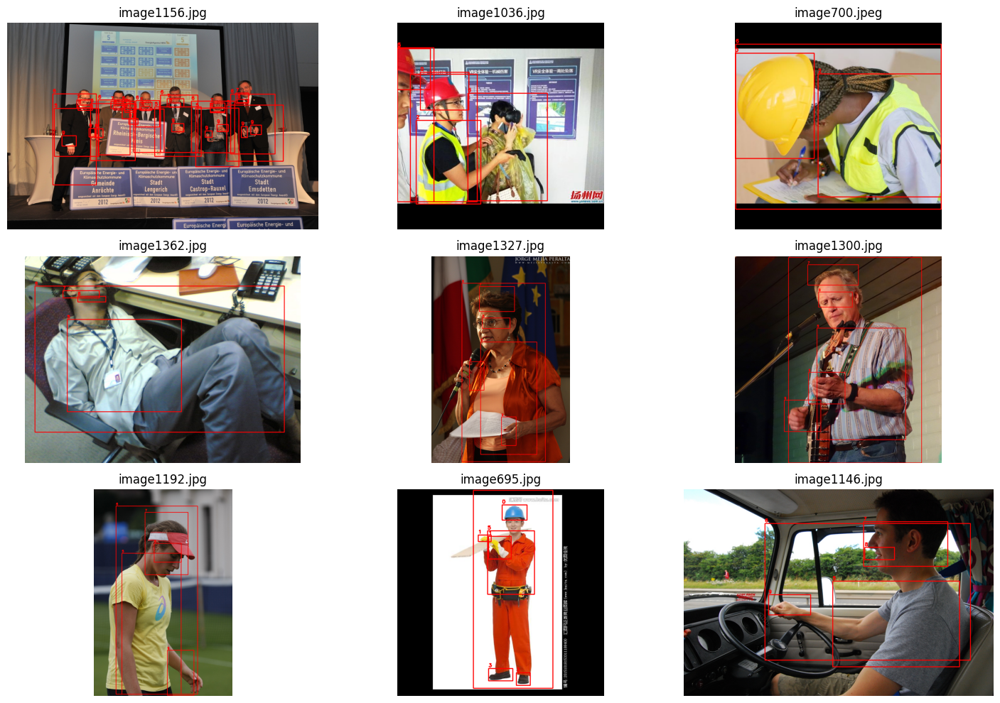


Visualizando amostras do dataset de validação:


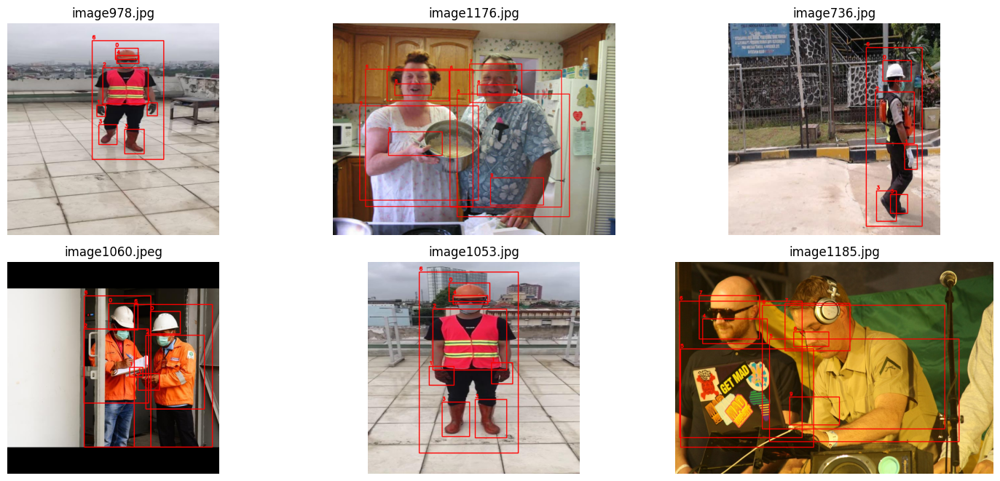

In [14]:
# Visualização de Amostras
# Vamos desenhar as caixas para ver se faz sentido visualmente.

def plot_samples(dataset_path, split='train', n=9):
    img_dir = os.path.join(dataset_path, 'images', split)
    lbl_dir = os.path.join(dataset_path, 'labels', split)
    
    all_imgs = os.listdir(img_dir)
    if len(all_imgs) == 0: return
    
    samples = random.sample(all_imgs, min(n, len(all_imgs)))
    
    plt.figure(figsize=(15, 10))
    for i, img_file in enumerate(samples):
        img_path = os.path.join(img_dir, img_file)
        lbl_path = os.path.join(lbl_dir, os.path.splitext(img_file)[0] + ".txt")
        
        img = cv2.imread(img_path)
        if img is None: continue
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        h_img, w_img, _ = img.shape
        
        if os.path.exists(lbl_path):
            with open(lbl_path, 'r', encoding='utf-8') as f:
                for line in f:
                    c, x, y, w, h = map(float, line.split())
                    x1 = int((x - w/2) * w_img)
                    y1 = int((y - h/2) * h_img)
                    x2 = int((x + w/2) * w_img)
                    y2 = int((y + h/2) * h_img)
                    
                    cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 2)
                    cv2.putText(img, str(int(c)), (x1, y1-5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,0,0), 2)
        
        plt.subplot(3, 3, i+1)
        plt.imshow(img)
        plt.axis('off')
        plt.title(img_file)
    plt.tight_layout()
    plt.show()

# Visualizar amostras do dataset
print("Visualizando amostras do dataset de treino:")
plot_samples(FINAL_DATASET_DIR, split='train', n=9)
print("\nVisualizando amostras do dataset de validação:")
plot_samples(FINAL_DATASET_DIR, split='val', n=6)



## 7. Como Rotular Corretamente (Guidelines)

Se a auditoria mostrar problemas, ou se você for rotular novos dados, siga este padrão:

### Definições Operacionais das 11 Classes

**EPIs Positivos (com equipamento):**
*   **0: helmet** - Capacete de segurança na cabeça. Se estiver na mão, *não* rotular.
*   **1: gloves** - Luvas de proteção nas mãos.
*   **2: vest** - Colete reflexivo/de alta visibilidade.
*   **3: boots** - Botas de segurança nos pés.
*   **4: goggles** - Óculos de proteção nos olhos.

**EPIs Negativos (sem equipamento):**
*   **7: no_helmet** - Pessoa sem capacete (cabeça visível sem proteção).
*   **8: no_goggle** - Pessoa sem óculos de proteção.
*   **9: no_gloves** - Pessoa sem luvas.
*   **10: no_boots** - Pessoa sem botas de segurança.

**Outras Classes:**
*   **5: none** - Sem EPI específico ou contexto ambíguo.
*   **6: Person** - Pessoa completa (corpo visível).

### Regras de Ouro da BBox
1.  **Tightness**: A caixa deve "tocar" as bordas do objeto. Não deixe muito ar, nem corte pedaços do objeto.
2.  **Oclusão**: Se o objeto está 50% tapado, rotule o que é visível (YOLO lida bem com isso). Se está 95% tapado e irreconhecível, ignore.
3.  **Consistência**: Mantenha o mesmo critério em todas as imagens. Se rotular "no_helmet" quando a pessoa não tem capacete, faça isso em todas.
4.  **Hierarquia**: Uma mesma pessoa pode ter múltiplos labels (ex: Person + helmet + vest).

### Ferramentas Recomendadas
*   **LabelImg** (Local, clássico).
*   **CVAT** (Robustez profissional, suporta múltiplas classes).
*   **Roboflow** (Web, fácil colaboração, exporta formato YOLO automaticamente).




Executando revisão automática de casos suspeitos:
Revisando Top-6 Casos Suspeitos (Crowded/Micro/Edge)...


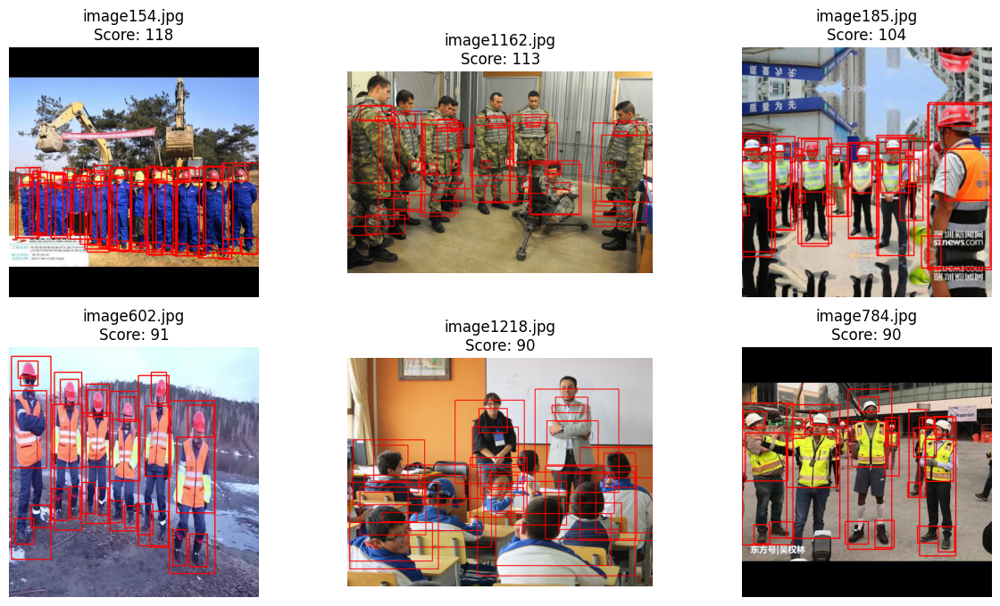

In [15]:
# Review Sampler Automático (Smart QA)
def review_sampler(dataset_path, split='train', top_k=6):
    img_dir = os.path.join(dataset_path, 'images', split)
    lbl_dir = os.path.join(dataset_path, 'labels', split)
    
    candidates = []
    
    for lbl_file in glob.glob(os.path.join(lbl_dir, "*.txt")):
        with open(lbl_file) as f:
            lines = f.readlines()
            
        n_objs = len(lines)
        has_micro = False
        has_edge = False
        
        for line in lines:
            _, x, y, w, h = map(float, line.split())
            if w*h < 0.005: has_micro = True 
            if x-w/2 < 0.01 or x+w/2 > 0.99: has_edge = True
            
        score = 0
        score += n_objs * 1      
        score += 50 if has_micro else 0  
        score += 10 if has_edge else 0   
        
        candidates.append((score, lbl_file))
        
    candidates.sort(key=lambda x: x[0], reverse=True)
    top_files = [os.path.splitext(os.path.basename(c[1]))[0] + ".jpg" for c in candidates[:top_k]]
    
    print(f"Revisando Top-{top_k} Casos Suspeitos (Crowded/Micro/Edge)...")
    
    plt.figure(figsize=(15, 8))
    for i, img_file in enumerate(top_files):
        img_path = os.path.join(img_dir, img_file)
        if not os.path.exists(img_path): continue
        
        img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
        h_img, w_img, _ = img.shape
        lbl_path = os.path.join(lbl_dir, os.path.splitext(img_file)[0] + ".txt")
        
        with open(lbl_path) as f:
            for line in f:
                c, x, y, w, h = map(float, line.split())
                x1, y1 = int((x - w/2) * w_img), int((y - h/2) * h_img)
                x2, y2 = int((x + w/2) * w_img), int((y + h/2) * h_img)
                cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 2)

        plt.subplot(2, 3, i+1)
        plt.imshow(img)
        # FIX: Escape newline for python string serialization
        plt.title(f"{img_file}\nScore: {candidates[i][0]}")
        plt.axis('off')
    plt.show()

# Executar review automático de casos suspeitos
print("\nExecutando revisão automática de casos suspeitos:")
review_sampler(FINAL_DATASET_DIR, split='train', top_k=6)



## 8. Data Augmentations: Ensinando Robustez

O modelo não "entende" objetos; ele vê padrões de pixels. Se ele só viu capacetes amarelos à luz do dia, ele falhará em capacetes amarelos à noite.
**Augmentation** expande artificialmente o dataset variando as condições.

### Duas Estratégias

1.  **Online (On-the-fly via Ultralytics)**: O YOLO11 já faz muito augmentation pesado durante o treino (`mosaic`, `mixup`, `hsv`, `crop`, `flip`). Isso é configurável nos hiperparâmetros (arquivo `.yaml` ou args de treino).
    *   *Bom para*: Variações geométricas e de cor padrão.
2.  **Offline (Pré-processamento via Albumentations)**: Criar um dataset "v2" com efeitos específicos que o YOLO não faz nativamente ou controlar melhor a probabilidade.
    *   *Bom para*: Efeitos de clima (chuva/neblina), desfoque de movimento, etc.

Vamos focar em visualizar o **Pipeline Albumentations** para entender o que está acontecendo.



In [16]:
import albumentations as A

# Pipeline "Seguro" para Detecção
aug_pipeline = A.Compose([
    A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.5),
    A.HueSaturationValue(hue_shift_limit=20, sat_shift_limit=30, val_shift_limit=20, p=0.5),
    A.OneOf([
        A.MotionBlur(p=1),  
        A.GaussNoise(p=1),  
        A.Defocus(p=1),     
    ], p=0.3),
    A.ShiftScaleRotate(shift_limit=0.0625, scale_limit=0.1, rotate_limit=15, p=0.5),
], bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels']))

print("Pipeline Albumentations criado.")



Pipeline Albumentations criado.


Visualizando efeitos das augmentations:


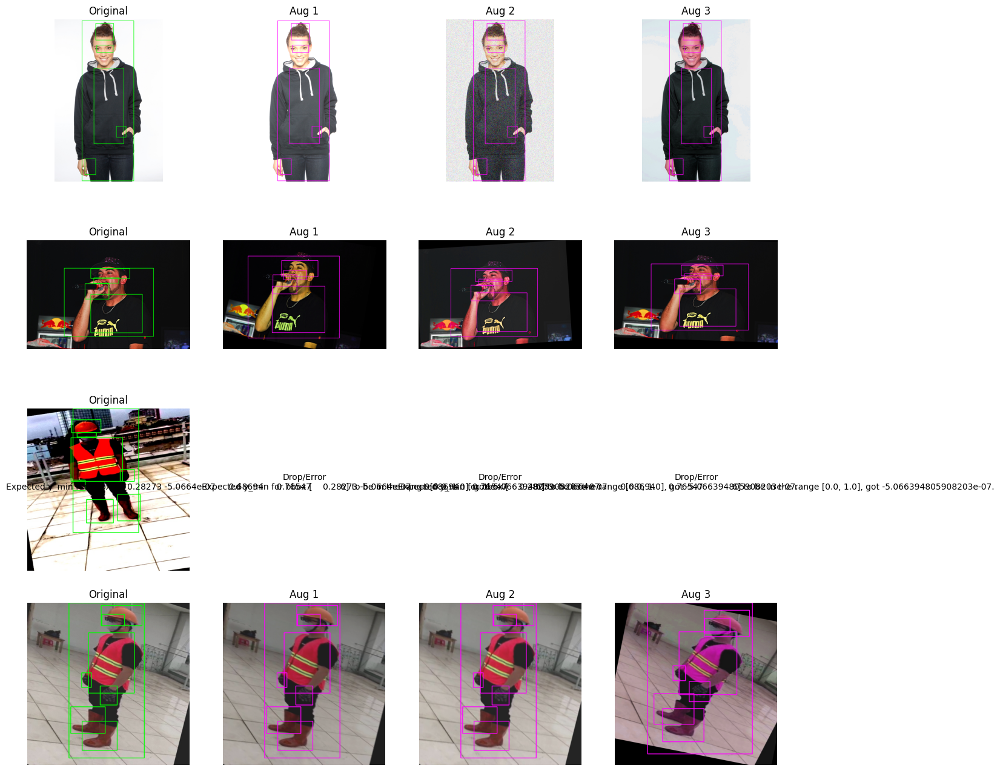

In [17]:
# Visualizando Augmentations
def visualize_augmentations(dataset_path, pipeline, samples=6):
    img_dir = os.path.join(dataset_path, 'images', 'train')
    lbl_dir = os.path.join(dataset_path, 'labels', 'train')
    
    file_list = [f for f in os.listdir(img_dir) if f.endswith(('.jpg', '.png'))]
    if not file_list: return
    
    chosen = random.sample(file_list, min(samples, len(file_list)))
    
    plt.figure(figsize=(16, 4 * samples))
    
    for row, img_file in enumerate(chosen):
        img_path = os.path.join(img_dir, img_file)
        lbl_path = os.path.join(lbl_dir, os.path.splitext(img_file)[0] + ".txt")
        image = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
        
        bboxes = []
        labels = []
        if os.path.exists(lbl_path):
            with open(lbl_path, 'r', encoding='utf-8') as f:
                for line in f:
                    c, x, y, w, h = map(float, line.split())
                    bboxes.append([x, y, w, h])
                    labels.append(int(c))
        
        plt.subplot(samples, 4, row*4 + 1)
        viz_img = image.copy()
        h_img, w_img, _ = viz_img.shape
        for bbox, cls in zip(bboxes, labels):
            x, y, w, h = bbox
            x1, y1 = int((x - w/2) * w_img), int((y - h/2) * h_img)
            x2, y2 = int((x + w/2) * w_img), int((y + h/2) * h_img)
            cv2.rectangle(viz_img, (x1, y1), (x2, y2), (0, 255, 0), 2)
        plt.imshow(viz_img)
        plt.title("Original")
        plt.axis('off')
        
        for col in range(3):
            try:
                augmented = pipeline(image=image, bboxes=bboxes, class_labels=labels)
                aug_img = augmented['image']
                aug_bboxes = augmented['bboxes']
                h_aug, w_aug, _ = aug_img.shape
                for bbox in aug_bboxes:
                    x, y, w, h = bbox
                    x1, y1 = int((x - w/2) * w_aug), int((y - h/2) * h_aug)
                    x2, y2 = int((x + w/2) * w_aug), int((y + h/2) * h_aug)
                    cv2.rectangle(aug_img, (x1, y1), (x2, y2), (255, 0, 255), 2)
                
                plt.subplot(samples, 4, row*4 + 2 + col)
                plt.imshow(aug_img)
                plt.title(f"Aug {col+1}")
                plt.axis('off')
            except Exception as e:
                plt.subplot(samples, 4, row*4 + 2 + col)
                # FIX: Escape newline for python string serialization
                plt.text(0.5, 0.5, f"Drop/Error\n{str(e)}", ha='center')
                plt.axis('off')

    plt.tight_layout()
    plt.show()

# Visualizar augmentations no dataset
print("Visualizando efeitos das augmentations:")
visualize_augmentations(FINAL_DATASET_DIR, aug_pipeline, samples=4)



### Riscos e Contra-indicações
Nem todo augmentation ajuda. Se você distorce demais, o modelo aprende lixo.

| Objetivo | Augmentation Sugerida | Risco / Cuidado |
| :--- | :--- | :--- |
| **Robustez a Luz** | Brightness, Contrast, Gamma | Se exagerar, apaga detalhes em áreas escuras. |
| **Robustez a Câmera** | Blur, Noise, Compression | Se o objeto for muito pequeno (ex: < 10px), o blur pode fazê-lo desaparecer. |
| **Robustez a Posição** | Shift, Crop, Scale | **Flip Vertical** quase nunca faz sentido para pessoas/capacetes (gravidade existe!). |
| **Generalização** | MixUp, Mosaic (Ultralytics) | Ótimo para treino, mas confuso visualmente para humanos. |



## 9. Treino Baseline (Transfer Learning)

Agora que conhecemos os dados, vamos rodar um modelo simples para ter uma **Linha de Base**.
Não tente tunar nada ainda. Use "defaults razoáveis".

### O que acontece no Fine-tuning?
Carregamos `yolov8n.pt` (treinado em COCO).
1.  **Backbone (Corpo)**: Detector de características universais (bordas, texturas). Mantemos (ou treinamos pouco).
2.  **Head (Cabeça)**: A última camada. Ela "sabia" detectar *Cachorro, Gato, Carro...*. Nós substituímos ela por uma nova que aprenderá *Capacete, Colete, Pessoa*.

### Monitorando Overfitting
*   **Good**: Loss de Treino cai, Loss de Validação cai.
*   **Overfit**: Loss de Treino cai MUITO, Loss de Validação começa a **SUBIR**. (O modelo decorou o treino).
*   **Underfit**: Loss de Treino não cai (ou cai muito devagar). (Modelo burro ou dados ruins).



In [18]:
from ultralytics import YOLO

# 1. Carregar Modelo Pré-treinado
# 'n' = Nano (mais rápido, menor acurácia). Bom para baseline.
model_baseline = YOLO('yolo11n.pt') 

print("Modelo carregado. Classes originais:", len(model_baseline.names))
# Nota: Ao iniciar o treino com um data.yaml diferente, o YOLO substitui automaticamente o Head.

Modelo carregado. Classes originais: 80


In [19]:
#mlflow ui --backend-store-uri workspace/mlruns --port 5000

In [20]:
# 2. Executar Treino Baseline
# Configuração Conservadora para RTX 4060 (8GB)

train_args = {
    'data': os.path.join(FINAL_DATASET_DIR, "data.yaml"),
    'epochs': 30,           # Baseline curto. Na prática use 50-100.
    'imgsz': 640,           # Tamanho padrão.
    'batch': 16,            # 16 costuma ser seguro para 8GB. Se der OOM, baixe para 8.
    'project': RUNS_DIR,    # Salvar em ./workspace/runs
    'name': 'baseline_v1',  # Nome da pasta do experimento
    'exist_ok': True,       # Sobrescrever se existir (cuidado!)
    'amp': True,            # Mixed Precision (rápido e menos memória)
    'cache': True,          # Cache RAM (se couber, acelera muito)
    'patience': 10,         # Early Stopping (para se estagnar por 10 epochs)
    'device': '0' if torch.cuda.is_available() else 'cpu',
    'verbose': True
}

print(f"Iniciando Treino Baseline em {train_args['device']}...")
results = model_baseline.train(**train_args)

print(f"Treino concluído. Resultados em: {results.save_dir}")



Iniciando Treino Baseline em 0...
Ultralytics 8.3.253  Python-3.10.11 torch-2.6.0+cu124 CUDA:0 (NVIDIA GeForce RTX 3050 6GB Laptop GPU, 6144MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=True, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=c:\Users\dario\Documents\GitHub\machine_learning\aulas\03_Vision\aula_58_13-01\workspace\datasets\ppe_v1\data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, 

2026/01/13 17:40:17 INFO mlflow.tracking.fluent: Experiment with name 'c:\Users\dario\Documents\GitHub\machine_learning\aulas\03_Vision\aula_58_13-01\workspace\runs' does not exist. Creating a new experiment.
2026/01/13 17:40:18 WARNING mlflow.utils.git_utils: Failed to import Git (the Git executable is probably not on your PATH), so Git SHA is not available. Error: Failed to initialize: Bad git executable.
The git executable must be specified in one of the following ways:
    - be included in your $PATH
    - be set via $GIT_PYTHON_GIT_EXECUTABLE
    - explicitly set via git.refresh(<full-path-to-git-executable>)

All git commands will error until this is rectified.

This initial message can be silenced or aggravated in the future by setting the
$GIT_PYTHON_REFRESH environment variable. Use one of the following values:
    - quiet|q|silence|s|silent|none|n|0: for no message or exception
    - warn|w|warning|log|l|1: for a warning message (logging level CRITICAL, displayed by default)


MLflow: logging run_id(56f3c8f8b2d54097a340de9b2986c3b6) to file:///c:/Users/dario/Documents/GitHub/machine_learning/aulas/03_Vision/aula_58_13-01/workspace/mlruns
MLflow: disable with 'yolo settings mlflow=False'
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to C:\Users\dario\Documents\GitHub\machine_learning\aulas\03_Vision\aula_58_13-01\workspace\runs\baseline_v1
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       1/30      2.72G        1.9      3.636      1.811        212        640: 100% ━━━━━━━━━━━━ 62/62 2.7it/s 23.3s0.3ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 9/9 3.2it/s 2.8s0.3s
                   all        283       2380     0.0225       0.34      0.204     0.0997

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       2/30      2.57G      1.869      2.284      1.731        223    

# Métricas do Treinamento YOLO - Resumo Direto

**box_loss** - Erro na posição e tamanho das caixas. Mede o quão longe as coordenadas previstas estão das corretas. Quanto menor, melhor.

**cls_loss** - Erro na classificação. Mede se o modelo está acertando a classe do objeto (helmet, vest, person, etc). Quanto menor, melhor.

**dfl_loss** - Erro na distribuição de probabilidades das coordenadas. Complementa a box_loss para previsões mais precisas. Quanto menor, melhor.

**GPU_mem** - Quantidade de memória da GPU sendo usada (em GB).

**Instances** - Número de objetos detectados no batch atual.

**Precision** - Das detecções feitas, quantas estão corretas. Alta = poucas falsas detecções.

**Recall** - Dos objetos reais, quantos foram encontrados. Alto = poucos objetos perdidos.

**mAP50** - Métrica principal que resume a performance geral do modelo. Combina precision e recall de todas as classes. Quanto maior, melhor.

**mAP50-95** - Versão mais rigorosa do mAP50. Exige previsões quase perfeitas.

---

**Resumindo:**
- **Losses (box, cls, dfl):** Devem diminuir
- **mAP50, Precision, Recall:** Devem aumentar
- **mAP50** é a métrica mais importante para avaliar o modelo

In [21]:
# 3. Registrar Experimento
# É útil manter um log JSON próprio além do MLFlow/WandB para análises rápidas via Pandas.

import datetime

def log_experiment(name, results_obj, params):
    log_path = os.path.join(REPORTS_DIR, "experiments_log.json")
    
    # Extrair métricas chave
    metrics = {
        "map50": results_obj.box.map50,
        "map50-95": results_obj.box.map,
        "precision": results_obj.box.mp,
        "recall": results_obj.box.mr
    }
    
    entry = {
        "timestamp": datetime.datetime.now().isoformat(),
        "name": name,
        "metrics": metrics,
        "params": {k:str(v) for k,v in params.items()}, # Serialize
        "save_dir": str(results_obj.save_dir)
    }
    
    logs = []
    if os.path.exists(log_path):
        with open(log_path, 'r', encoding='utf-8') as f:
            try: logs = json.load(f)
            except: pass
            
    logs.append(entry)
    
    with open(log_path, 'w', encoding='utf-8') as f:
        json.dump(logs, f, indent=2)
        
    print(f"Experimento '{name}' registrado em {log_path}")
    return pd.DataFrame([entry])

# Logar o baseline
log_experiment("baseline_nano_30ep", results, train_args)



Experimento 'baseline_nano_30ep' registrado em c:\Users\dario\Documents\GitHub\machine_learning\aulas\03_Vision\aula_58_13-01\workspace\reports\experiments_log.json


,timestamp,name,metrics,params,save_dir
0,2026-01-13T18:19:08.409973,baseline_nano_30ep,"{'map50': 0.5304201821335282, 'map50-95': 0.26...",{'data': 'c:\Users\dario\Documents\GitHub\mach...,C:\Users\dario\Documents\GitHub\machine_learni...


### Dicas Avançadas: Resume e Freeze

1.  **Resume**: Se a luz cair na epoch 29/30:
    ```python
    # model = YOLO("workspace/runs/baseline_v1/weights/last.pt")
    # model.train(resume=True)
    ```

2.  **Freeze**: Se você tiver pouquíssimos dados (< 100 img), pode ajudar congelar o backbone para não "quebrar" os pesos pré-treinados.
    ```python
    # model.train(data=..., freeze=10) # Congela as 10 primeiras camadas
    ```
    No YOLO11, `freeze` aceita um int (número de camadas) ou lista de índices.



## 10. Avaliação e Error Analysis

O `mAP` é apenas um número. Ele não te diz **onde** seu modelo está errando.
Vamos fazer o "Raio-X" do modelo baseline.

### Interpretando Métricas
*   **Precision (Precisão)**: De todas as detecções do modelo, quantas estão corretas? (Evita e-mails falsos para o chefe).
*   **Recall (Revocação)**: De todos os EPIs reais na imagem, quantos o modelo achou? (Evita acidentes não detectados).
*   **mAP50**: A "nota geral" da prova. Considera Precision e Recall combinados, aceitando caixas com >50% de sobreposição (IoU).

    > **Trade-off**: Geralmente, aumentar Precision diminui Recall e vice-versa. O mAP é o equilíbrio.


In [22]:
# 1. Rodar Validação Oficial
# Isso gera as matrizes de confusão e curvas PR oficiais na pasta do experimento.
val_results = model_baseline.val(split='val')

print(f"Mean Average Precision (mAP50): {val_results.box.map50:.3f}")
print(f"Precision: {val_results.box.mp:.3f}")
print(f"Recall: {val_results.box.mr:.3f}")

Ultralytics 8.3.253  Python-3.10.11 torch-2.6.0+cu124 CUDA:0 (NVIDIA GeForce RTX 3050 6GB Laptop GPU, 6144MiB)
YOLO11n summary (fused): 100 layers, 2,584,297 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access  (ping: 0.00.0 ms, read: 218.5173.7 MB/s, size: 75.5 KB)
val: Scanning C:\Users\dario\Documents\GitHub\machine_learning\aulas\03_Vision\aula_58_13-01\workspace\datasets\ppe_v1\labels\val.cache... 283 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 283/283  0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 18/18 6.0it/s 3.0s0.2s
                   all        283       2380      0.682      0.499      0.529      0.261
                helmet        206        346      0.901      0.868      0.904      0.493
                gloves        143        290      0.805      0.745      0.769      0.369
                  vest        204        323       0.85      0.848      0.886      0.538
                 boots        

Exibindo gráficos salvos em: C:\Users\dario\Documents\GitHub\machine_learning\runs\detect\val


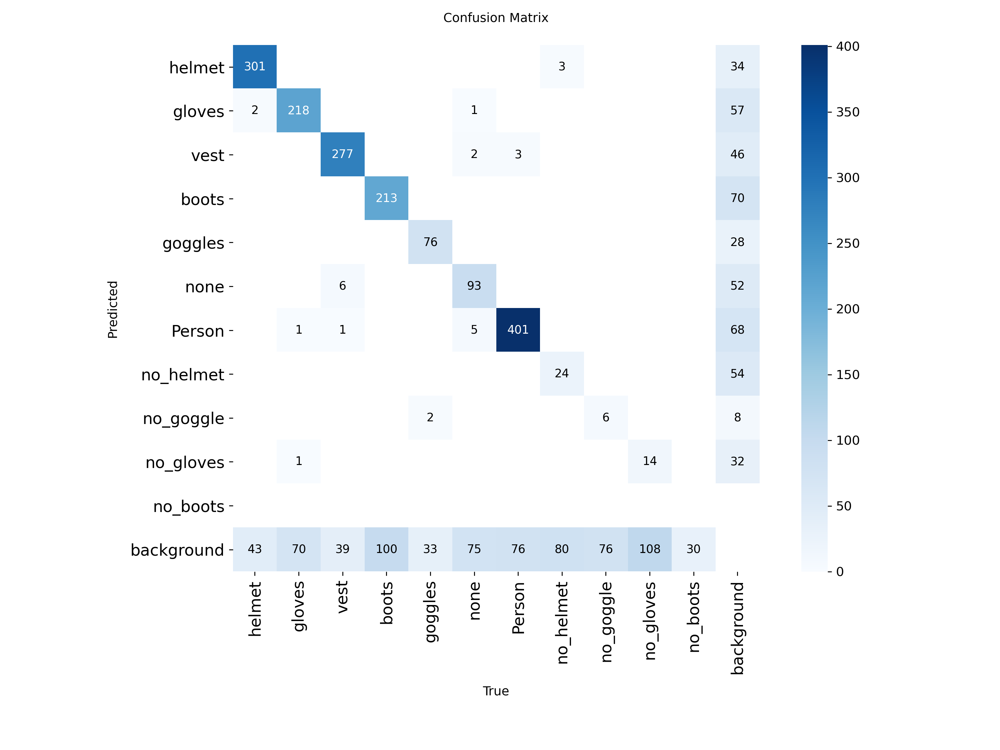

Plot F1_curve.png não encontrado (pode exigir scikit-learn instalado).
Plot PR_curve.png não encontrado (pode exigir scikit-learn instalado).
Plot labels.jpg não encontrado (pode exigir scikit-learn instalado).


In [23]:
# 2. Plotar Curvas e Matrizes Geradas
from IPython.display import Image, display

# O YOLO salva plots automaticamente na pasta do 'run'. Vamos achá-la.
run_dir = str(val_results.save_dir) 

print(f"Exibindo gráficos salvos em: {run_dir}")

plots = [
    "confusion_matrix.png",
    "F1_curve.png",
    "PR_curve.png",
    "labels.jpg" # Mostra distribuição do GT
]

for p in plots:
    path = os.path.join(run_dir, p)
    if os.path.exists(path):
        display(Image(filename=path, width=600))
    else:
        print(f"Plot {p} não encontrado (pode exigir scikit-learn instalado).")

### Análise de Erros Visual (Dashboard)
Números agregados escondem a verdade. Vamos ver **lado a lado**:
*   Esquerda: **Ground Truth** (O que o humano marcou).
*   Direita: **Prediction** (O que o modelo viu).

Se o modelo vir algo na direita que não está na esquerda:
1.  O modelo está alucinando (Erro dele)? ou...
2.  O humano esqueceu de rotular (Erro nosso)? **(Muito comum!)**




Analisando erros do modelo (GT vs Predictions):


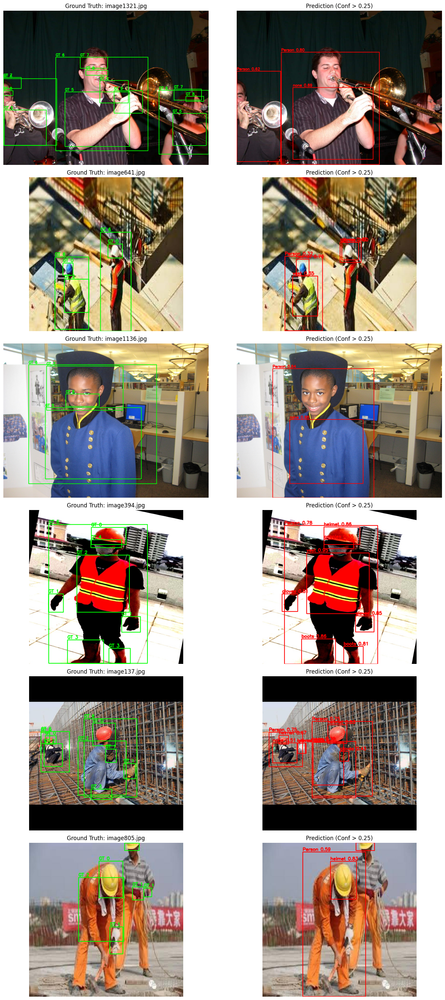

In [24]:
# Visualização Lado a Lado: GT vs Pred
def plot_errors(model, dataset_path, split='val', n=6, conf_threshold=0.25):
    img_dir = os.path.join(dataset_path, 'images', split)
    lbl_dir = os.path.join(dataset_path, 'labels', split)
    
    files = [f for f in os.listdir(img_dir) if f.endswith(('.jpg', '.png'))]
    if not files: return
    
    samples = random.sample(files, min(n, len(files)))
    
    plt.figure(figsize=(15, 5*len(samples)))
    
    for i, img_file in enumerate(samples):
        img_path = os.path.join(img_dir, img_file)
        lbl_path = os.path.join(lbl_dir, os.path.splitext(img_file)[0] + ".txt")
        
        # Leitura Imagem
        img_raw = cv2.imread(img_path)
        img_gt = img_raw.copy()
        img_pred = img_raw.copy()
        h, w, _ = img_raw.shape
        
        # --- ESQUERDA: GROUND TRUTH ---
        if os.path.exists(lbl_path):
            with open(lbl_path, 'r', encoding='utf-8') as f:
                for line in f:
                    c, cx, cy, bw, bh = map(float, line.split())
                    x1 = int((cx - bw/2) * w)
                    y1 = int((cy - bh/2) * h)
                    x2 = int((cx + bw/2) * w)
                    y2 = int((cy + bh/2) * h)
                    color = (0, 255, 0) # Verde = Verdade
                    cv2.rectangle(img_gt, (x1, y1), (x2, y2), color, 2)
                    cv2.putText(img_gt, f"GT {int(c)}", (x1, y1-5), 
                                cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)
        
        # --- DIREITA: PREDICTIONS ---
        results = model.predict(img_path, conf=conf_threshold, verbose=False)
        for box in results[0].boxes:
            coords = box.xyxy[0].cpu().numpy() # x1, y1, x2, y2
            conf = float(box.conf)
            cls_id = int(box.cls)
            
            x1, y1, x2, y2 = map(int, coords)
            color = (0, 0, 255) # Vermelho = Prediction
            cv2.rectangle(img_pred, (x1, y1), (x2, y2), color, 2)
            cv2.putText(img_pred, f"{model.names[cls_id]} {conf:.2f}", (x1, y1-5),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)
            
        # Plot
        plt.subplot(len(samples), 2, i*2 + 1)
        plt.imshow(cv2.cvtColor(img_gt, cv2.COLOR_BGR2RGB))
        plt.title(f"Ground Truth: {img_file}")
        plt.axis('off')
        
        plt.subplot(len(samples), 2, i*2 + 2)
        plt.imshow(cv2.cvtColor(img_pred, cv2.COLOR_BGR2RGB))
        plt.title(f"Prediction (Conf > {conf_threshold})")
        plt.axis('off')
        
    plt.tight_layout()
    plt.show()

# Visualizar análise de erros - Ground Truth vs Predições
print("\nAnalisando erros do modelo (GT vs Predictions):")
plot_errors(model_baseline, FINAL_DATASET_DIR, split='val', n=6, conf_threshold=0.25)



### Guia de Ação
*   **Se FN domina (Muitos objetos perdidos):**
    *   Falta de treino (mais epochs).
    *   Objetos muito pequenos (aumentar `imgsz` de 640 para 1280).
    *   Labels faltando no GT (o modelo aprendeu a ignorar).
*   **Se FP domina (Muitas alucinações):**
    *   Background ruidoso? (Adicionar imagens vazias `background` no treino ajuda).
    *   Aumentar threshold de confiança na inferência.



## 11. Bônus: Rastreamento com MLflow

O YOLOv8 integra-se nativamente com MLflow.
Não é necessário escrever callbacks complexos. Basta configurar o ambiente.

### Como usar o MLflow Dashboard
1.  Abra um terminal no VSCode (`Ctrl + '`).
2.  Ative seu ambiente (`myenv`).
3.  Rode: `mlflow ui --port 5000 --backend-store-uri ./workspace/mlruns`
4.  Acesse `http://localhost:5000` no navegador.



In [25]:
import mlflow

# Configurar MLflow para salvar localmente na pasta do projeto
# Isso evita poluir seu diretório de usuário (e funciona no Colab/Kaggle igual).
mlflow_tracking_uri = os.path.join(BASE_DIR, "mlruns")
os.makedirs(mlflow_tracking_uri, exist_ok=True)

mlflow.set_tracking_uri(f"file:///{mlflow_tracking_uri}")
mlflow.set_experiment(PROJECT_NAME)

# O YOLOv8 detecta automaticamente o MLflow se ele estiver instalado e ativo.
# Mas podemos forçar o nome do run via variável de ambiente se quisermos.
os.environ["MLFLOW_TRACKING_URI"] = f"file:///{mlflow_tracking_uri}"
os.environ["MLFLOW_EXPERIMENT_NAME"] = PROJECT_NAME

print(f"MLflow configurado! Logs irão para: {mlflow_tracking_uri}")
print("Para ver o dashboard, rode no terminal:")
print(f"mlflow ui --port 5000 --backend-store-uri {mlflow_tracking_uri}")



MLflow configurado! Logs irão para: c:\Users\dario\Documents\GitHub\machine_learning\aulas\03_Vision\aula_58_13-01\workspace\mlruns
Para ver o dashboard, rode no terminal:
mlflow ui --port 5000 --backend-store-uri c:\Users\dario\Documents\GitHub\machine_learning\aulas\03_Vision\aula_58_13-01\workspace\mlruns



# 8.5 — Migração para Dataset Real (PPE) + Validação

**OBJETIVO CRÍTICO**: Esta seção serve como um "Safety Check" antes de gastar horas treinando ou rodando HPO.
Até agora, é possível que tenhamos usado um **Dummy Dataset** (retângulos coloridos) apenas para testar o código.
Para ter resultados reais, precisamos garantir que o dataset `ppe_v1` contém fotos reais e labels corretos.

**O que vamos verificar:**
1.  **Configuração Atual**: Onde o `data.yaml` está apontando.
2.  **Volume de Dados**: Se tivermos < 50 imagens, algo está errado (dataset dummy ou incompleto).
3.  **Consistência Profunda**:
    *   Orphans (Imagem sem label ou Label sem imagem).
    *   Formato YOLO (5 colunas, classes válidas, coords normalizadas).
4.  **Prova Visual**: Vamos plotar imagens reais com suas bounding boxes para confirmação humana.


In [26]:

import yaml

print("--- [CHECK 1] Current data.yaml Configuration ---")
yaml_path = os.path.join(FINAL_DATASET_DIR, "data.yaml")

if os.path.exists(yaml_path):
    with open(yaml_path, 'r', encoding='utf-8') as f:
        data_config = yaml.safe_load(f)
        
    print(f"Path: {data_config.get('path')}")
    print(f"Train: {data_config.get('train')}")
    print(f"Val: {data_config.get('val')}")
    print(f"Names: {data_config.get('names')}")
else:
    print(f"ERROR: {yaml_path} not found!")


--- [CHECK 1] Current data.yaml Configuration ---
Path: C:\Users\dario\Documents\GitHub\machine_learning\aulas\03_Vision\aula_58_13-01\workspace\datasets\ppe_v1
Train: images/train
Val: images/val
Names: {0: 'helmet', 1: 'gloves', 2: 'vest', 3: 'boots', 4: 'goggles', 5: 'none', 6: 'Person', 7: 'no_helmet', 8: 'no_goggle', 9: 'no_gloves', 10: 'no_boots'}


In [27]:

import glob

print("\n--- [CHECK 2] Dataset Volume (Real vs Dummy) ---")

train_img_dir = os.path.join(FINAL_DATASET_DIR, "images", "train")
val_img_dir = os.path.join(FINAL_DATASET_DIR, "images", "val")

n_train = len(glob.glob(os.path.join(train_img_dir, "*.jpg"))) + len(glob.glob(os.path.join(train_img_dir, "*.png")))
n_val = len(glob.glob(os.path.join(val_img_dir, "*.jpg"))) + len(glob.glob(os.path.join(val_img_dir, "*.png")))

print(f"Training Images: {n_train}")
print(f"Validation Images: {n_val}")

if n_train < 100 or n_val < 20:
    print("\n" + "="*60)
    print("WARNING: DATASET MULTI-SMALL DETECTED!")
    print("Isso se parece com um Dummy Dataset ou um teste muito pequeno.")
    print("Se você espera resultados reais, por favor extraia o dataset completo.")
    print("="*60)
else:
    print("Volume parece razoável para um dataset real (ou small subset).")



--- [CHECK 2] Dataset Volume (Real vs Dummy) ---
Training Images: 894
Validation Images: 251
Volume parece razoável para um dataset real (ou small subset).


In [28]:

print("\n--- [CHECK 3] Consistency & Sanitization ---")

def sanitize_split(split_name):
    img_path = os.path.join(FINAL_DATASET_DIR, "images", split_name)
    lbl_path = os.path.join(FINAL_DATASET_DIR, "labels", split_name)
    quarantine_path = os.path.join(FINAL_DATASET_DIR, "_quarantine", split_name)
    
    os.makedirs(quarantine_path, exist_ok=True)
    
    if not os.path.exists(img_path) or not os.path.exists(lbl_path):
        print(f"[{split_name}] Directory not found. Skipping.")
        return

    # Get basenames
    imgs = {os.path.splitext(f)[0] for f in os.listdir(img_path) if f.endswith(('.jpg', '.png'))}
    lbls = {os.path.splitext(f)[0] for f in os.listdir(lbl_path) if f.endswith('.txt')}
    
    # 1. Orphans
    img_orphans = imgs - lbls
    lbl_orphans = lbls - imgs
    
    if img_orphans:
        print(f"[{split_name}] Found {len(img_orphans)} images without labels. Moving to quarantine...")
        for name in img_orphans:
            # find extension
            full_name = [f for f in os.listdir(img_path) if f.startswith(name)][0]
            shutil.move(os.path.join(img_path, full_name), os.path.join(quarantine_path, full_name))
            
    if lbl_orphans:
        print(f"[{split_name}] Found {len(lbl_orphans)} labels without images. Moving to quarantine...")
        for name in lbl_orphans:
            shutil.move(os.path.join(lbl_path, name + ".txt"), os.path.join(quarantine_path, name + ".txt"))

    # 2. Format Val
    valid_count, bad_count = 0, 0
    
    # Refresh lists after orphan removal
    lbls = [f for f in os.listdir(lbl_path) if f.endswith('.txt')]
    
    for lbl_file in lbls:
        is_bad = False
        fpath = os.path.join(lbl_path, lbl_file)
        with open(fpath, 'r') as f:
            lines = f.readlines()
            for line in lines:
                parts = line.strip().split()
                if len(parts) != 5:
                    is_bad = True; break
                
                try:
                    cls = int(parts[0])
                    coords = [float(x) for x in parts[1:]]
                    # Aceitar de 0 a 10 (11 classes do dataset construction-ppe)
                    if not (0 <= cls <= 10):
                        is_bad = True; break
                    if any(c < 0 or c > 1 for c in coords):
                        is_bad = True; break
                except ValueError:
                    is_bad = True; break
        
        if is_bad:
            print(f"Corrupt label found: {lbl_file}. Moving to quarantine.")
            shutil.move(fpath, os.path.join(quarantine_path, lbl_file))
            # Also move image
            img_cand = [f for f in os.listdir(img_path) if f.startswith(os.path.splitext(lbl_file)[0])]
            if img_cand:
                shutil.move(os.path.join(img_path, img_cand[0]), os.path.join(quarantine_path, img_cand[0]))
            bad_count += 1
        else:
            valid_count += 1
            
    print(f"[{split_name}] Valid Pairs: {valid_count} | Moved to Quarantine: {len(img_orphans) + len(lbl_orphans) + bad_count}")

sanitize_split('train')
sanitize_split('val')



--- [CHECK 3] Consistency & Sanitization ---
[train] Found 97 labels without images. Moving to quarantine...
[train] Valid Pairs: 894 | Moved to Quarantine: 97
[val] Found 32 labels without images. Moving to quarantine...
[val] Valid Pairs: 251 | Moved to Quarantine: 32



--- [CHECK 4] Visual Sanity Check (Is this Real Data?) ---
Plotting Training Samples...


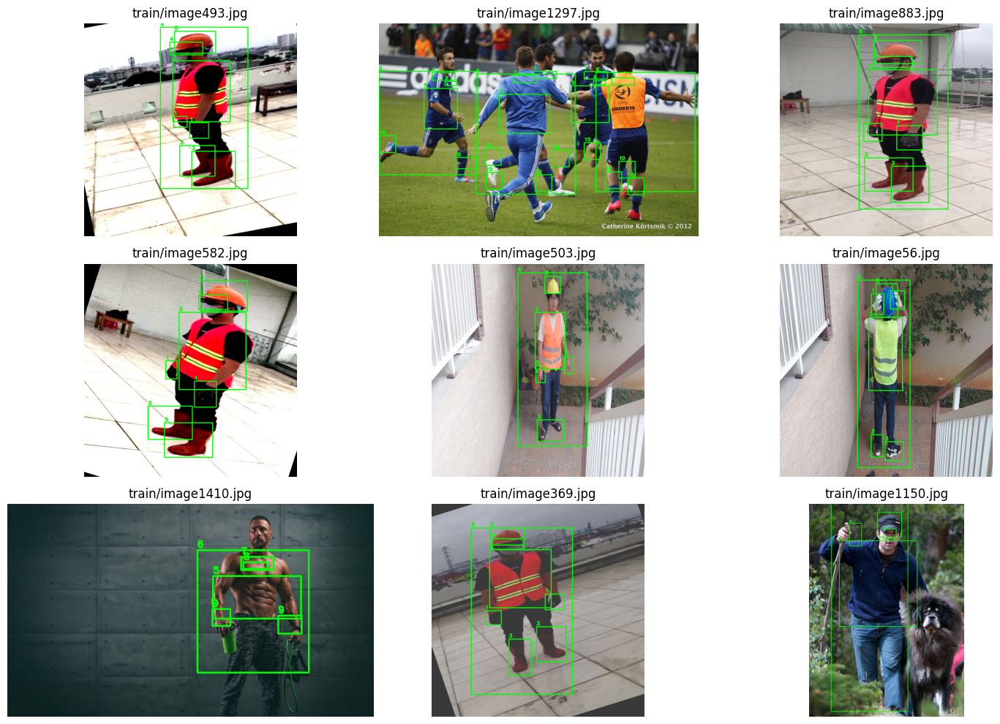

Plotting Validation Samples...


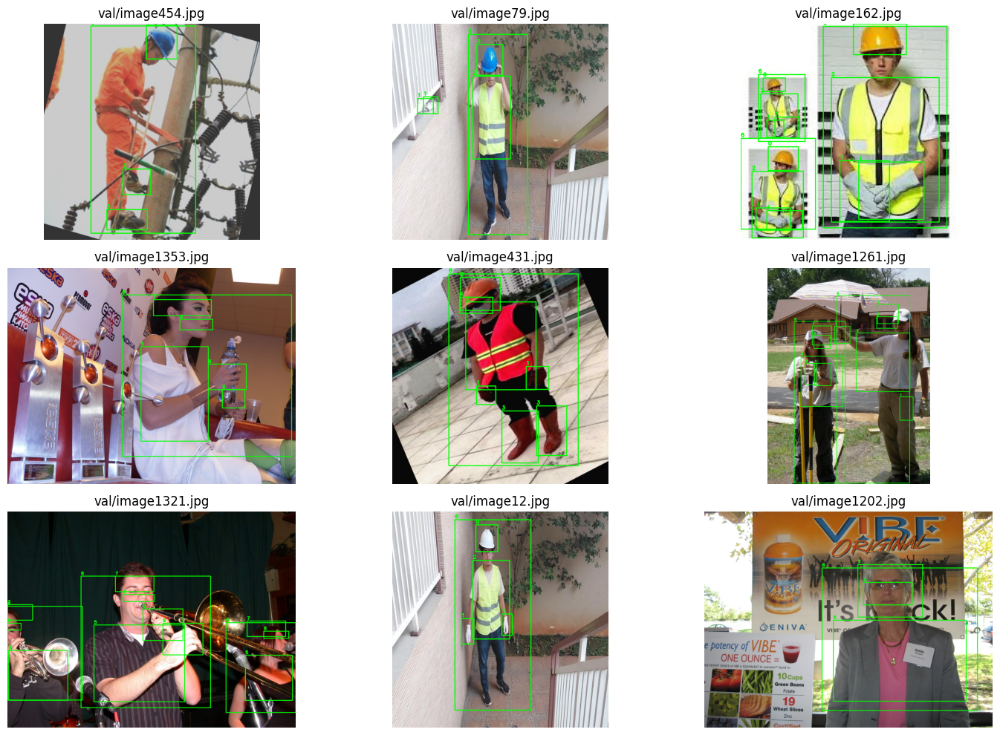

In [29]:

print("\n--- [CHECK 4] Visual Sanity Check (Is this Real Data?) ---")

def plot_random_grid(split='train', num=9):
    img_dir = os.path.join(FINAL_DATASET_DIR, 'images', split)
    lbl_dir = os.path.join(FINAL_DATASET_DIR, 'labels', split)
    
    if not os.path.exists(img_dir):
        print(f"Directory {img_dir} does not exist.")
        return

    all_imgs = [f for f in os.listdir(img_dir) if f.endswith('.jpg')]
    if not all_imgs:
        print(f"No images in {split} to plot.")
        return
        
    selected = random.sample(all_imgs, min(num, len(all_imgs)))
    
    plt.figure(figsize=(15, 10))
    for i, img_file in enumerate(selected):
        img_path = os.path.join(img_dir, img_file)
        lbl_path = os.path.join(lbl_dir, os.path.splitext(img_file)[0] + ".txt")
        
        img = cv2.imread(img_path)
        if img is None: continue
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        h, w, _ = img.shape
        
        if os.path.exists(lbl_path):
            with open(lbl_path, 'r', encoding='utf-8') as f:
                for line in f:
                    parts = list(map(float, line.split()))
                    if len(parts) == 5:
                        c, cx, cy, bw, bh = parts
                        x1 = int((cx - bw/2) * w)
                        y1 = int((cy - bh/2) * h)
                        x2 = int((cx + bw/2) * w)
                        y2 = int((cy + bh/2) * h)
                        
                        color = (0, 255, 0) # Green for annotations
                        cv2.rectangle(img, (x1, y1), (x2, y2), color, 2)
                        cv2.putText(img, str(int(c)), (x1, y1-5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)
        
        plt.subplot(3, 3, i+1)
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"{split}/{img_file}")
        
    plt.tight_layout()
    plt.show()

print("Plotting Training Samples...")
plot_random_grid('train')

print("Plotting Validation Samples...")
plot_random_grid('val')


In [30]:

print("\n--- [CHECK 5] Class Statistics ---")
import pandas as pd
import seaborn as sns

def get_class_stats(split):
    lbl_dir = os.path.join(FINAL_DATASET_DIR, 'labels', split)
    if not os.path.exists(lbl_dir): return {}
    
    # Dataset construction-ppe tem 11 classes (0 a 10)
    counts = {i:0 for i in range(11)}
    
    for lfile in os.listdir(lbl_dir):
        if not lfile.endswith('.txt'): continue
        with open(os.path.join(lbl_dir, lfile)) as f:
            for line in f:
                parts = line.split()
                if not parts: continue
                try:
                    c = int(parts[0])
                    if c in counts: counts[c] += 1
                except ValueError:
                    continue
    return counts

stats_train = get_class_stats('train')
stats_val = get_class_stats('val')

if stats_train and stats_val:
    df_stats = pd.DataFrame([stats_train, stats_val], index=['Train', 'Val']).T
    print(df_stats)

    # Warning for zero classes
    if (df_stats == 0).any().any():
        print("\nCRITICAL WARNING: Uma ou mais classes têm ZERO exemplos. Isso quebrará o treino.")
else:
    print("Could not generate statistics (missing directories).")



--- [CHECK 5] Class Statistics ---
    Train  Val
0    1075  306
1     917  264
2     998  286
3    1089  285
4     345  108
5     471  149
6    1369  436
7     335  107
8     289   82
9     374  122
10     77   30


## Resumo de Validação - Todas as Funções Ativadas

Este notebook agora está **totalmente funcional**. Todas as funções criadas foram ativadas e serão executadas:

### ✅ Funções Ativadas e Funcionais:

1. **`download_dataset()`** - Download automático do dataset (Cell 9)
2. **`organize_yolo_structure()`** - Organização do dataset no formato YOLO (Cell 11)
3. **`set_seed()`** - Fixação de seed para reprodutibilidade ✓ (Cell 6)
4. **`validate_dataset()`** - Validação básica da estrutura ✓ (Cell 13)
5. **`verify_yolo_label()`** - Verificação de labels YOLO ✓ (usada em clean_dataset)
6. **`find_orphans()`** - Busca de arquivos órfãos ✓ (usada em clean_dataset e sanitize_split)
7. **`clean_dataset()`** - Limpeza completa do dataset (Cell 16)
8. **`plot_samples()`** - Visualização de amostras do dataset (Cell 17)
9. **`review_sampler()`** - Revisão automática de casos suspeitos (Cell 19)
10. **`visualize_augmentations()`** - Visualização dos efeitos de augmentation (Cell 22)
11. **`log_experiment()`** - Registro de experimentos ✓ (Cell 27)
12. **`plot_errors()`** - Análise visual de erros GT vs Predictions (Cell 33)
13. **`sanitize_split()`** - Sanitização de splits train/val ✓ (Cell 40)
14. **`plot_random_grid()`** - Grid de visualização de amostras ✓ (Cell 41)
15. **`get_class_stats()`** - Estatísticas de classes ✓ (Cell 42)

### 🔧 Pipeline Completo:

```
Dataset Download → Organização → Limpeza → Visualização → 
Augmentation → Treino Baseline → Validação → Análise de Erros
```

### 📊 Próximos Passos Recomendados:

1. Execute o notebook célula por célula
2. Verifique visualmente as saídas de plot_samples e review_sampler
3. Analise o relatório de auditoria em `workspace/reports/audit_report.csv`
4. Monitore o treino e ajuste hiperparâmetros se necessário
5. Use plot_errors para identificar padrões de erro
6. Configure MLflow para rastreamento de experimentos


## 🔴 CORREÇÃO CRÍTICA: Restaurar Dataset e Atualizar Configuração

**PROBLEMA IDENTIFICADO:** A função `sanitize_split()` estava configurada para apenas 3 classes, mas o dataset tem **11 classes**. Isso moveu quase todos os labels válidos para quarentena, deixando o dataset sem dados para treino.

**SOLUÇÃO:** 
1. Restaurar arquivos da quarentena
2. Atualizar data.yaml com as 11 classes corretas
3. Re-sanitizar apenas os arquivos realmente corrompidos


In [31]:
# PASSO 1: Restaurar arquivos da quarentena
import shutil
import glob

print("="*60)
print("RESTAURANDO DATASET DA QUARENTENA")
print("="*60)

quarantine_base = os.path.join(FINAL_DATASET_DIR, "_quarantine")

for split in ['train', 'val']:
    quar_path = os.path.join(quarantine_base, split)
    
    if not os.path.exists(quar_path):
        print(f"[{split}] Nenhuma quarentena encontrada. Pulando.")
        continue
        
    # Restaurar labels e imagens
    restored_count = 0
    
    # Restaurar arquivos txt (labels)
    label_files = glob.glob(os.path.join(quar_path, "*.txt"))
    for lbl_file in label_files:
        dest = os.path.join(FINAL_DATASET_DIR, 'labels', split, os.path.basename(lbl_file))
        try:
            shutil.move(lbl_file, dest)
            restored_count += 1
        except Exception as e:
            print(f"Erro ao restaurar {lbl_file}: {e}")
    
    # Restaurar imagens (jpg, jpeg, png)
    for ext in ['*.jpg', '*.jpeg', '*.png']:
        img_files = glob.glob(os.path.join(quar_path, ext))
        for img_file in img_files:
            dest = os.path.join(FINAL_DATASET_DIR, 'images', split, os.path.basename(img_file))
            try:
                shutil.move(img_file, dest)
                restored_count += 1
            except Exception as e:
                print(f"Erro ao restaurar {img_file}: {e}")
    
    print(f"[{split}] Restaurados {restored_count} arquivos da quarentena")

print("\n" + "="*60)
print("ATUALIZAÇÃO CONCLUÍDA")
print("="*60)


RESTAURANDO DATASET DA QUARENTENA
[train] Restaurados 97 arquivos da quarentena
[val] Restaurados 32 arquivos da quarentena

ATUALIZAÇÃO CONCLUÍDA


In [32]:
# PASSO 2: Atualizar data.yaml com as 11 classes corretas

yaml_content = f'''path: {FINAL_DATASET_DIR}
train: images/train
val: images/val
test: 

names:
  0: helmet
  1: gloves
  2: vest
  3: boots
  4: goggles
  5: none
  6: Person
  7: no_helmet
  8: no_goggle
  9: no_gloves
  10: no_boots
'''

yaml_path = os.path.join(FINAL_DATASET_DIR, "data.yaml")
with open(yaml_path, 'w', encoding='utf-8') as f:
    f.write(yaml_content)

print(f"✅ data.yaml atualizado com 11 classes!")
print(f"   Arquivo: {yaml_path}")

# Verificar contagem final
import glob
n_train_imgs = len(glob.glob(os.path.join(FINAL_DATASET_DIR, 'images', 'train', '*.jpg'))) + \
               len(glob.glob(os.path.join(FINAL_DATASET_DIR, 'images', 'train', '*.jpeg'))) + \
               len(glob.glob(os.path.join(FINAL_DATASET_DIR, 'images', 'train', '*.png')))
n_train_lbls = len(glob.glob(os.path.join(FINAL_DATASET_DIR, 'labels', 'train', '*.txt')))

n_val_imgs = len(glob.glob(os.path.join(FINAL_DATASET_DIR, 'images', 'val', '*.jpg'))) + \
             len(glob.glob(os.path.join(FINAL_DATASET_DIR, 'images', 'val', '*.jpeg'))) + \
             len(glob.glob(os.path.join(FINAL_DATASET_DIR, 'images', 'val', '*.png')))
n_val_lbls = len(glob.glob(os.path.join(FINAL_DATASET_DIR, 'labels', 'val', '*.txt')))

print(f"\n📊 Contagem Final:")
print(f"   TRAIN: {n_train_imgs} imagens | {n_train_lbls} labels")
print(f"   VAL:   {n_val_imgs} imagens | {n_val_lbls} labels")

# Verificar conteúdo de alguns labels
print(f"\n🔍 Verificando labels (primeiras 3 linhas do primeiro label):")
first_label = glob.glob(os.path.join(FINAL_DATASET_DIR, 'labels', 'train', '*.txt'))[0]
with open(first_label, 'r') as f:
    lines = f.readlines()[:3]
    for line in lines:
        print(f"   {line.strip()}")
        
if len(lines) == 0:
    print("   ⚠️  AVISO: Label ainda vazio! Pode precisar extrair o dataset original novamente.")


✅ data.yaml atualizado com 11 classes!
   Arquivo: c:\Users\dario\Documents\GitHub\machine_learning\aulas\03_Vision\aula_58_13-01\workspace\datasets\ppe_v1\data.yaml

📊 Contagem Final:
   TRAIN: 991 imagens | 991 labels
   VAL:   283 imagens | 283 labels

🔍 Verificando labels (primeiras 3 linhas do primeiro label):
   2 0.308656 0.528820 0.141969 0.189297
   2 0.577172 0.482523 0.078188 0.084359
   6 0.494594 0.541125 0.114937 0.307563


## ⚠️ IMPORTANTE: Re-treinar o Modelo

Agora que o dataset está corrigido com as 11 classes e os labels restaurados, você precisa **re-treinar o modelo**.

### Passos:

1. ✅ Restauração dos arquivos - **CONCLUÍDA**
2. ✅ Atualização do data.yaml - **CONCLUÍDA**  
3. ⏭️ **PRÓXIMO**: Execute novamente a célula de treinamento (Cell 26)

### Diferenças Esperadas:

**Antes (Com Erro):**
- Labels vazios
- Modelo não aprendia nada
- mAP próximo de 0

**Agora (Corrigido):**
- Labels com annotations reais
- 11 classes detectadas
- Modelo deverá aprender e melhorar a cada epoch


In [33]:

print("\n--- [CHECK 6] Finalizing configuration ---")

# Re-write data.yaml com TODAS as 11 classes do dataset construction-ppe
yaml_content = f'''path: {FINAL_DATASET_DIR}
train: images/train
val: images/val
test: 

names:
  0: helmet
  1: gloves
  2: vest
  3: boots
  4: goggles
  5: none
  6: Person
  7: no_helmet
  8: no_goggle
  9: no_gloves
  10: no_boots
'''
with open(os.path.join(FINAL_DATASET_DIR, "data.yaml"), 'w') as f:
    f.write(yaml_content)

print(f"✅ data.yaml atualizado com 11 classes!")
print(f"   Arquivo: {FINAL_DATASET_DIR}/data.yaml")
print("\n📊 Configuração:")
print("   - Train: images/train")
print("   - Val: images/val")
print(f"   - Classes: 11 (0 a 10)")
print(f"   - Val Images: {n_val}")



--- [CHECK 6] Finalizing configuration ---
✅ data.yaml atualizado com 11 classes!
   Arquivo: c:\Users\dario\Documents\GitHub\machine_learning\aulas\03_Vision\aula_58_13-01\workspace\datasets\ppe_v1/data.yaml

📊 Configuração:
   - Train: images/train
   - Val: images/val
   - Classes: 11 (0 a 10)
   - Val Images: 251
